In [1]:
%load_ext autoreload
%autoreload 2

import numpy  as np
import pandas as pd

from matplotlib import pyplot as plt

from common import hallmark as hm

In [2]:
def getdist(path, dist):
    df = pd.read_csv(path, sep='\t')
    return df[dist].values

pf = hm.ParaFrame('cache/Illinois_thermal_w{win:d}/{mag}a{aspin:g}_i{inc:d}/summ_Rh{Rhigh:d}_{freq}.tsv')

for k in set(pf.keys()) - {'path'}:
    globals()[k] = np.unique(pf[k])
    print(k, globals()[k][:16])

freq ['230GHz' '2um' '86GHz']
inc [ 10  30  50  70  90 110 130 150 170]
win [3 4 5]
aspin [-0.94 -0.5   0.    0.5   0.94]
mag ['M' 'S']
Rhigh [  1  10  40 160]


Ftot 86GHz
Ftot 230GHz
Ftot 2um
major_FWHM 86GHz
major_FWHM 230GHz
major_FWHM 2um
minor_FWHM 86GHz
minor_FWHM 230GHz
minor_FWHM 2um
PA 86GHz
PA 230GHz
PA 2um
alpha0 86GHz
alpha0 230GHz
alpha0 2um
beta0 86GHz
beta0 230GHz
beta0 2um


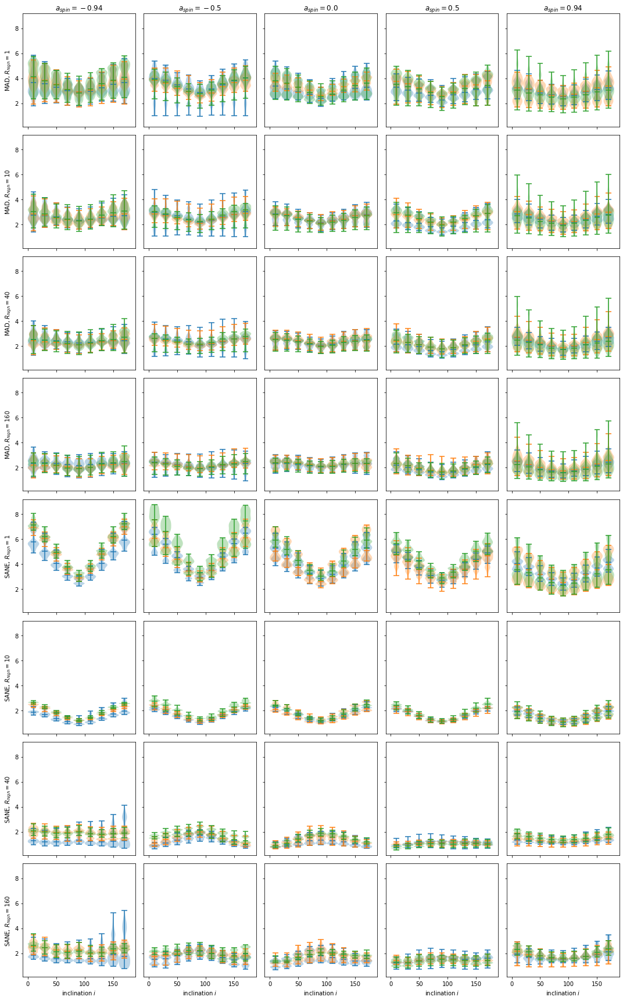

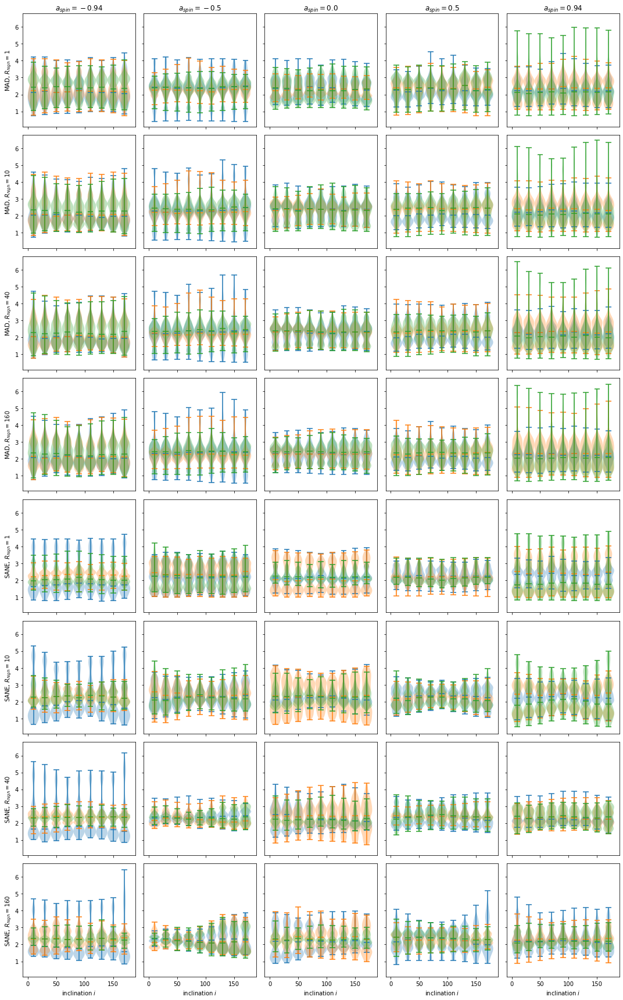

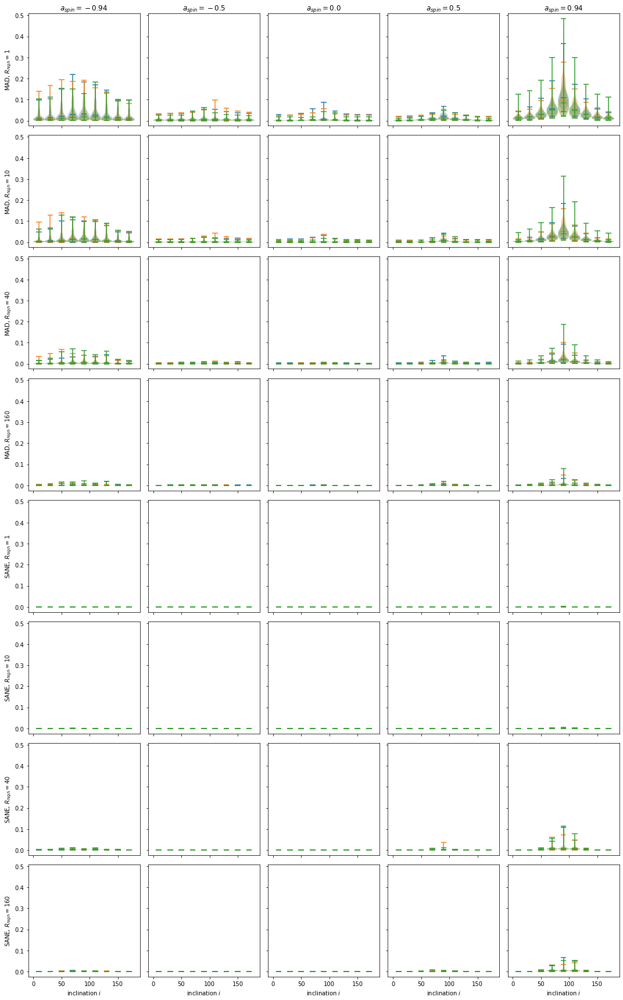

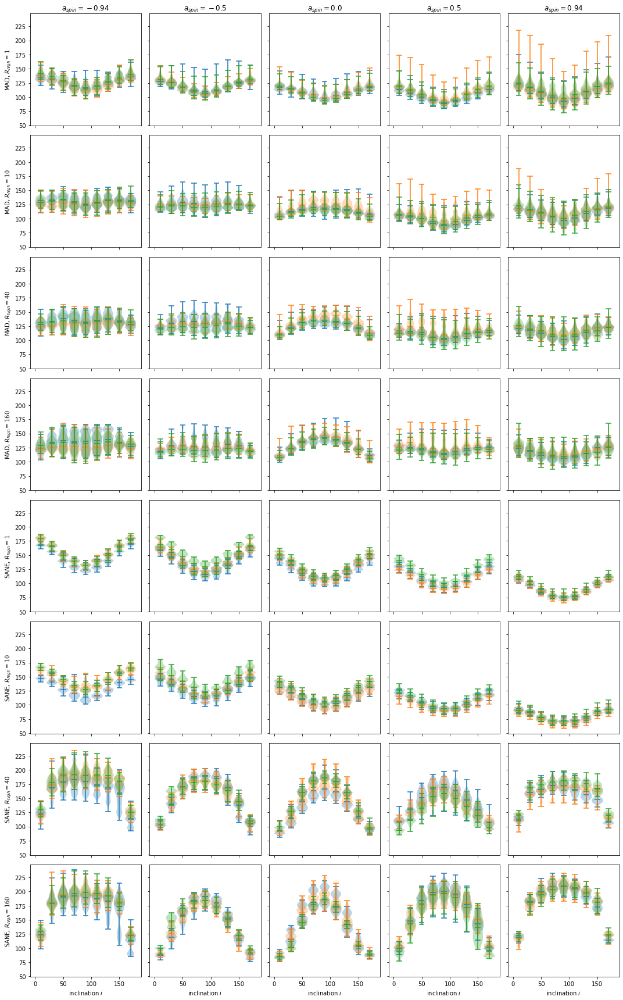

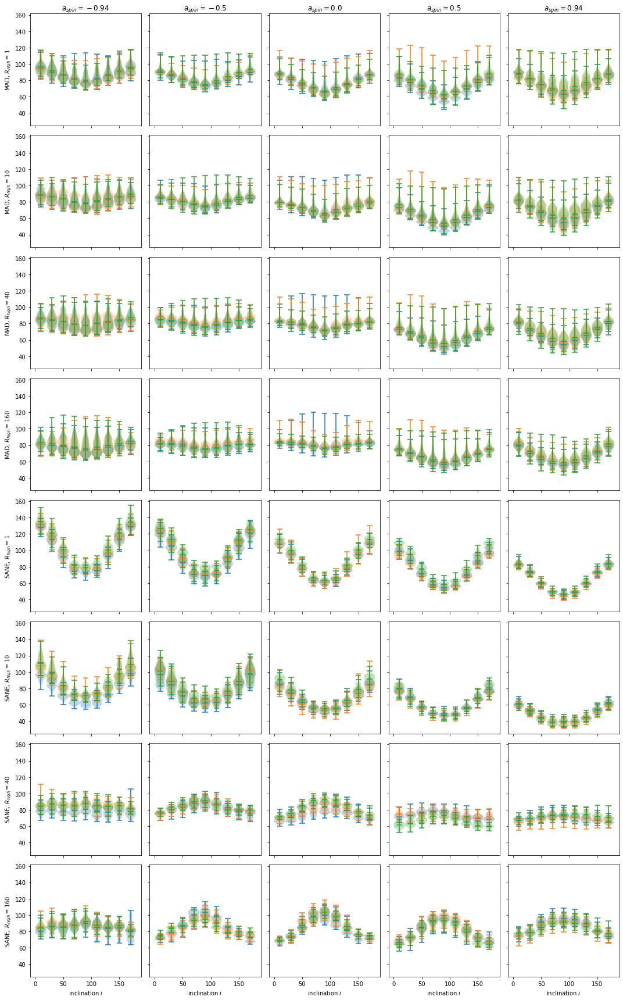

...

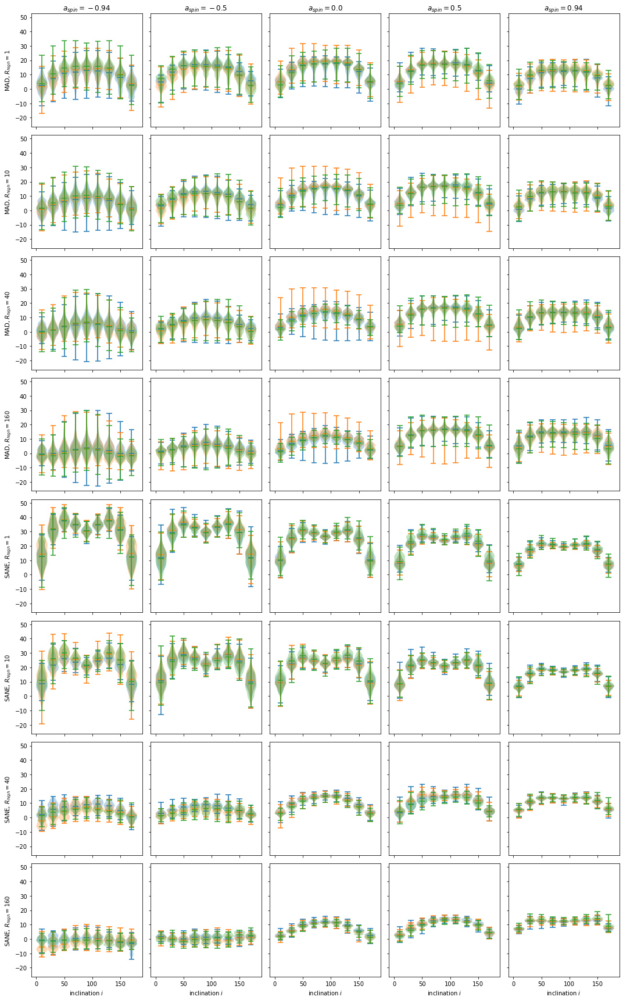

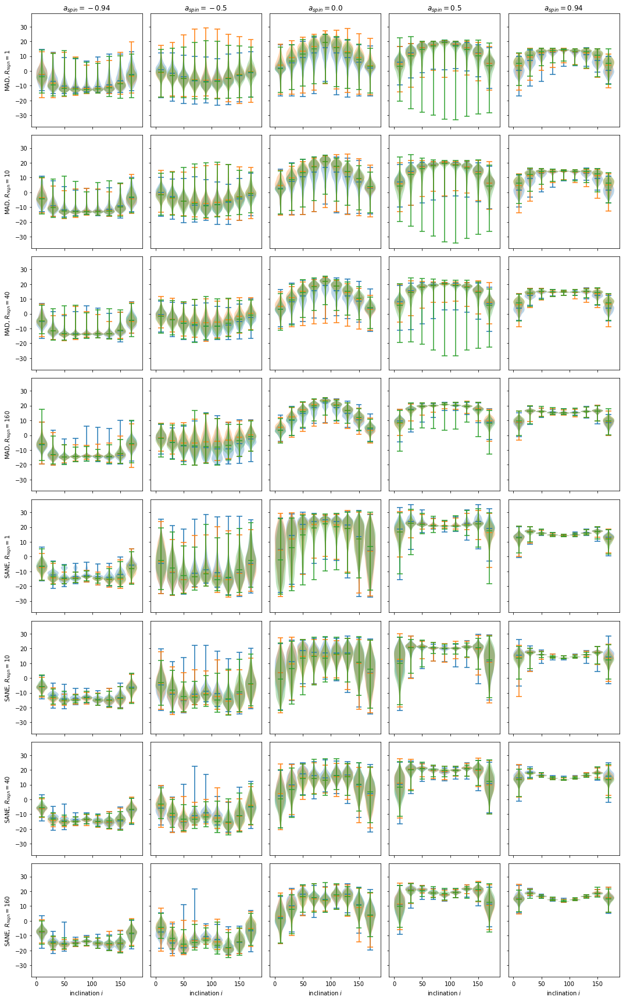

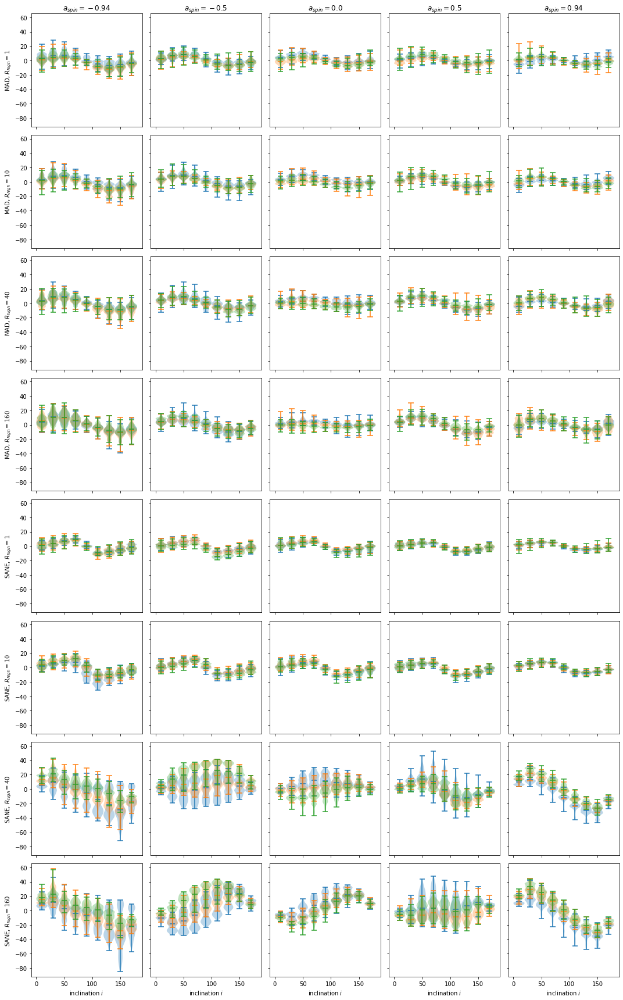

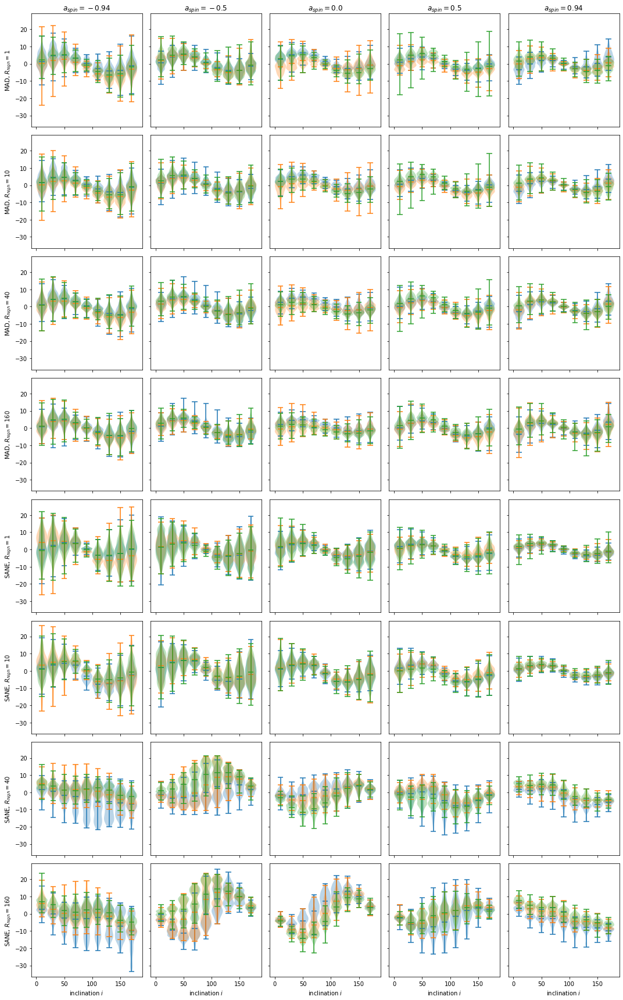

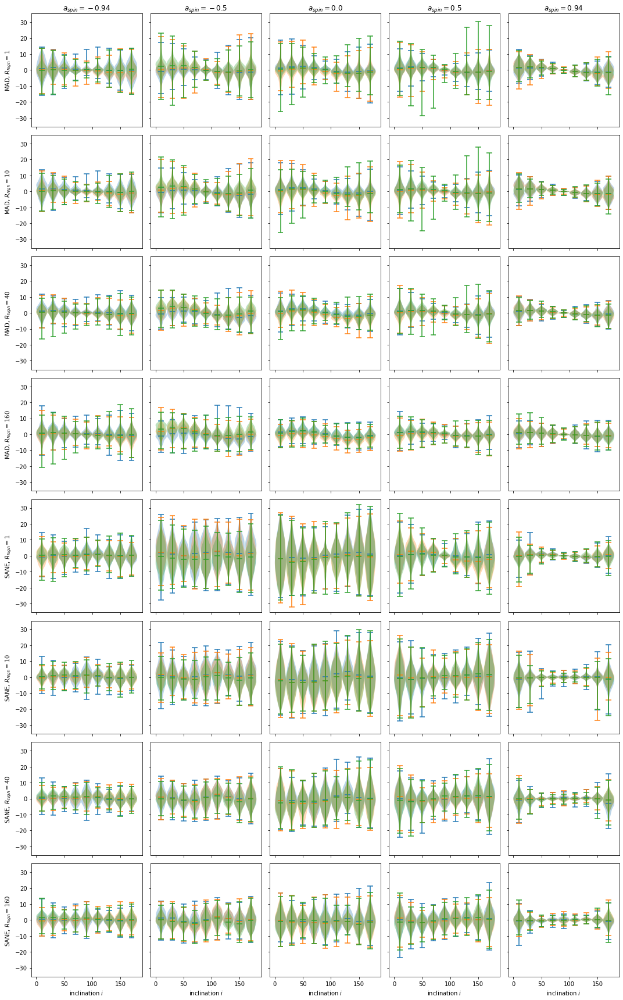

In [3]:
for dist in ['Ftot', 'major_FWHM', 'minor_FWHM', 'PA', 'alpha0', 'beta0']:
    for freq in ['86GHz', '230GHz', '2um']:
        print(dist, freq)
        
        fig, axes = plt.subplots(8, 5, figsize=(15,24), sharex=True, sharey=True)

        for c, a in enumerate(aspin):
            for r1, m in enumerate(mag):
                for r2, Rh in enumerate(Rhigh):
                    #print(a, m, Rh)
                    r = r1 * 4 + r2
            
                    for w in win:
                        sel = pf(freq=freq)(aspin=a)(mag=m)(Rhigh=Rh)(win=w)
                        if len(sel) != 9:
                            print('WARNING: too many matchingn tables')
                        dists = [getdist(sel(inc=i).path.iloc[0], dist) for i in inc]
                        axes[r][c].violinplot(dists, positions=inc, widths=20, showmedians=True)

                    if r == 0:
                        axes[r][c].set_title(f'$a_{{spin}} = {a}$')
                    elif r == 7:
                        axes[r][c].set_xlabel('inclination $i$')
                    if c == 0:
                        axes[r][c].set_ylabel(f'{"MAD" if m == "M" else "SANE"}, $R_{{high}} = {Rh}$')
            
        fig.tight_layout()
        fig.savefig(f'output/plot/pd_{dist}_Illinois_thermal_{freq}.pdf')